# Object Detection on Satellite Imagery using YOLOv8

##  2. Pretrained on COCO, finetune on DIOR and test on DIOR

In [ ]:
!pip install -U -q gdown ultralytics

In [ ]:
!pip install scikit-learn

In [ ]:
import os
import shutil
import gdown
import random
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from collections import Counter
from xml.etree import ElementTree
import cv2
import matplotlib.pyplot as plt
from IPython.display import Image, Video
from ultralytics import YOLO

## Downloading Dataset

In [ ]:
raw_data_path = 'raw_data'

In [ ]:
if os.path.exists(raw_data_path):
    print('[INFO] Raw data directory exists, skiping download.')
else:
    os.makedirs(raw_data_path)
    print('[INFO] Raw data directory is been created.')
    print('[INFO] Downloading data...\n')
    gdown.download('https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw', output=os.path.join(raw_data_path, 'Annotations.zip'))
    gdown.download('https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr', output=os.path.join(raw_data_path, 'JPEGImages-test.zip'))
    gdown.download('https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir', output=os.path.join(raw_data_path, 'JPEGImages-trainval.zip'))
    print('[INFO] Data is been downloaded.')

[INFO] Raw data directory exists, skiping download.


In [ ]:
dior_data_path = 'dior_data'

In [ ]:
# Extracting the zip data files
if os.path.exists(dior_data_path):
    print('[INFO] DIOR data directory exists, skiping extraction.')
else:
    os.makedirs(dior_data_path)
    for i in os.listdir(raw_data_path):
        filename = os.path.join(raw_data_path, i)
        shutil.unpack_archive(filename=filename, extract_dir=dior_data_path)
        print(f'[INFO] File "{filename}" is been extracted to "{dior_data_path}".')

[INFO] DIOR data directory exists, skiping extraction.


## Data Preprocessing, EDA and Visualization

In [ ]:
# Path for all the data
annot_data_path = 'dior_data/Annotations/Horizontal Bounding Boxes'
trainval_data_path = 'dior_data/JPEGImages-trainval'
test_data_path = 'dior_data/JPEGImages-test'

In [ ]:
pip install matplotlib opencv-python xmltodict tqdm


Note: you may need to restart the kernel to use updated packages.


Image Path: dior_data/JPEGImages-trainval/03001.jpg
Annotation Path: dior_data/Annotations/Horizontal Bounding Boxes/03001.xml
Image Path: dior_data/JPEGImages-test/17863.jpg
Annotation Path: dior_data/Annotations/Horizontal Bounding Boxes/17863.xml
Image Path: dior_data/JPEGImages-trainval/07575.jpg
Annotation Path: dior_data/Annotations/Horizontal Bounding Boxes/07575.xml
Image Path: dior_data/JPEGImages-test/17134.jpg
Annotation Path: dior_data/Annotations/Horizontal Bounding Boxes/17134.xml


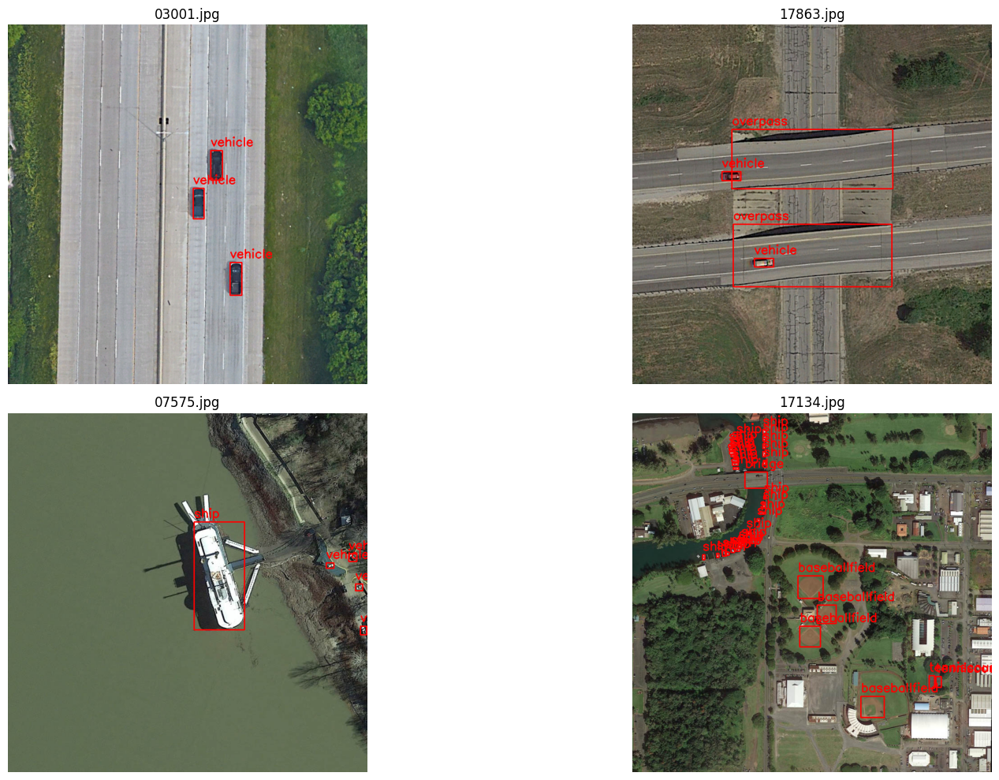

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import cv2
import xmltodict
from tqdm import tqdm


# Creating a list of annotation files
annot_file_list = sorted([os.path.join(annot_data_path, i) for i in os.listdir(annot_data_path) if '.xml' in i])

# Creating a list of training and validation images
trainval_file_list = sorted([os.path.join(trainval_data_path, i) for i in os.listdir(trainval_data_path) if '.jpg' in i])

# Creating a list of testing images
test_file_list = sorted([os.path.join(test_data_path, i) for i in os.listdir(test_data_path) if '.jpg' in i])

# Combining all the images path in one list
image_data_file_list = trainval_file_list + test_file_list

def parse_annotation(file):
    try:
        with open(file, 'rb') as f:
            xml_dict = xmltodict.parse(f.read())
        return xml_dict
    except FileNotFoundError:
        print(f"Annotation file {file} not found.")
        return None

def draw_bboxes(image_path, annotation):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    objects = annotation['annotation']['object']
    if isinstance(objects, dict):
        objects = [objects]

    for obj in objects:
        class_name = obj['name']
        bbox = obj['bndbox']
        x1, y1, x2, y2 = int(bbox['xmin']), int(bbox['ymin']), int(bbox['xmax']), int(bbox['ymax'])
        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(image, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

    return image

# Choose 3-4 random images
random_images = random.sample(image_data_file_list, 4)

plt.figure(figsize=(20, 10))

for idx, img_path in enumerate(random_images):
    annot_file = img_path.replace('JPEGImages-trainval', 'Annotations/Horizontal Bounding Boxes').replace('JPEGImages-test', 'Annotations/Horizontal Bounding Boxes').replace('.jpg', '.xml')
    print(f"Image Path: {img_path}")
    print(f"Annotation Path: {annot_file}")
    annotation = parse_annotation(annot_file)

    if annotation is not None:
        image_with_bboxes = draw_bboxes(img_path, annotation)
        plt.subplot(2, 2, idx + 1)
        plt.imshow(image_with_bboxes)
        plt.title(os.path.basename(img_path))
        plt.axis('off')

plt.subplots_adjust(wspace=0.02, hspace=0.1)  # Adjust the spacing between subplots
plt.tight_layout()
plt.show()


In [ ]:
# Creating a list of annotation files
annot_file_list = sorted([os.path.join(annot_data_path, i) for i in os.listdir(annot_data_path) if '.xml' in i])
annot_file_list[:5], annot_file_list[-5:], len(annot_file_list)

(['dior_data/Annotations/Horizontal Bounding Boxes/00001.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00002.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00003.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00004.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00005.xml'],
 ['dior_data/Annotations/Horizontal Bounding Boxes/23459.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23460.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23461.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23462.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23463.xml'],
 23463)

In [ ]:
# Creating a list of training and validation images
trainval_file_list = sorted([os.path.join(trainval_data_path, i) for i in os.listdir(trainval_data_path) if '.jpg' in i])
trainval_file_list[:5], trainval_file_list[-5:], len(trainval_file_list)

(['dior_data/JPEGImages-trainval/00001.jpg',
  'dior_data/JPEGImages-trainval/00002.jpg',
  'dior_data/JPEGImages-trainval/00003.jpg',
  'dior_data/JPEGImages-trainval/00004.jpg',
  'dior_data/JPEGImages-trainval/00005.jpg'],
 ['dior_data/JPEGImages-trainval/11721.jpg',
  'dior_data/JPEGImages-trainval/11722.jpg',
  'dior_data/JPEGImages-trainval/11723.jpg',
  'dior_data/JPEGImages-trainval/11724.jpg',
  'dior_data/JPEGImages-trainval/11725.jpg'],
 11725)

In [ ]:
# Creating a list of testing images
test_file_list = sorted([os.path.join(test_data_path, i) for i in os.listdir(test_data_path) if '.jpg' in i])
test_file_list[:5], test_file_list[-5:], len(test_file_list)

(['dior_data/JPEGImages-test/11726.jpg',
  'dior_data/JPEGImages-test/11727.jpg',
  'dior_data/JPEGImages-test/11728.jpg',
  'dior_data/JPEGImages-test/11729.jpg',
  'dior_data/JPEGImages-test/11730.jpg'],
 ['dior_data/JPEGImages-test/23459.jpg',
  'dior_data/JPEGImages-test/23460.jpg',
  'dior_data/JPEGImages-test/23461.jpg',
  'dior_data/JPEGImages-test/23462.jpg',
  'dior_data/JPEGImages-test/23463.jpg'],
 11738)

In [ ]:
# Combining all the images path in one list
image_data_file_list = np.concatenate((trainval_file_list, test_file_list))
image_data_file_list[:5], image_data_file_list[-5:], len(image_data_file_list)

(array(['dior_data/JPEGImages-trainval/00001.jpg', 'dior_data/JPEGImages-trainval/00002.jpg', 'dior_data/JPEGImages-trainval/00003.jpg', 'dior_data/JPEGImages-trainval/00004.jpg', 'dior_data/JPEGImages-trainval/00005.jpg'], dtype='<U39'),
 array(['dior_data/JPEGImages-test/23459.jpg', 'dior_data/JPEGImages-test/23460.jpg', 'dior_data/JPEGImages-test/23461.jpg', 'dior_data/JPEGImages-test/23462.jpg', 'dior_data/JPEGImages-test/23463.jpg'], dtype='<U39'),
 23463)

### Exploratory Data Analysis

In [ ]:
# Extracting data from annotation files
meta_list = [] # To store general info for every image
object_list_train = [] # To store object classes info of train dataset
object_list_test = [] # To store object classes info of test dataset

for file in tqdm(annot_file_list):
    meta_dict = {}
    root = ElementTree.parse(file).getroot()

    # Filename - extracted
    for path in image_data_file_list:
        if root.find('filename').text in path:
            meta_dict['filename'] = path
            meta_dict['split_type'] = path.split('/')[1]

    # Width - extracted
    meta_dict['width'] = int(root.find('size').find('width').text)

    # Height - extracted
    meta_dict['height'] = int(root.find('size').find('height').text)

    # Objects - extracted and combined into a single string
    meta_dict['objects'] = ', '.join(np.unique([obj.find('name').text for obj in root.findall('object')]))
    meta_list.append(meta_dict)

    # Collecting all the object classes instance and counting total appearance
    for obj in root.findall('object'):
        if meta_dict['split_type'] == 'JPEGImages-trainval':
            object_list_train.append(obj.find('name').text)
        elif meta_dict['split_type'] == 'JPEGImages-test':
            object_list_test.append(obj.find('name').text)

# Counting the instance for every object class
object_instance_list_train = Counter(sorted(object_list_train))
object_instance_list_test = Counter(sorted(object_list_test))

# Collecting Class list and indexing it also in a sequence
class_dict = {k: v for v, k in enumerate(sorted(np.unique(object_list_train)))}

meta_list[:5], object_instance_list_train, object_instance_list_test, class_dict

100%|██████████| 23463/23463 [07:20<00:00, 53.28it/s]


([{'filename': 'dior_data/JPEGImages-trainval/00001.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'golffield'},
  {'filename': 'dior_data/JPEGImages-trainval/00002.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'Expressway-toll-station, vehicle'},
  {'filename': 'dior_data/JPEGImages-trainval/00003.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'trainstation'},
  {'filename': 'dior_data/JPEGImages-trainval/00004.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'chimney'},
  {'filename': 'dior_data/JPEGImages-trainval/00005.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'storagetank, vehicle'}],
 Counter({'ship': 27351,
          'vehicle': 13725,
          'tenniscourt': 4898,
          'storagetank': 3042,
          'baseballfield': 2384,
          '

In [ ]:
# Creating a dataframe from the extracted data
meta_df = pd.DataFrame(meta_list)
meta_df

,filename,split_type,width,height,objects
0,dior_data/JPEGImages-trainval/00001.jpg,JPEGImages-trainval,800,800,golffield
1,dior_data/JPEGImages-trainval/00002.jpg,JPEGImages-trainval,800,800,"Expressway-toll-station, vehicle"
2,dior_data/JPEGImages-trainval/00003.jpg,JPEGImages-trainval,800,800,trainstation
3,dior_data/JPEGImages-trainval/00004.jpg,JPEGImages-trainval,800,800,chimney
4,dior_data/JPEGImages-trainval/00005.jpg,JPEGImages-trainval,800,800,"storagetank, vehicle"
...,...,...,...,...,...
23458,dior_data/JPEGImages-test/23459.jpg,JPEGImages-test,800,800,vehicle
23459,dior_data/JPEGImages-test/23460.jpg,JPEGImages-test,800,800,"groundtrackfield, tenniscourt, vehicle"
23460,dior_data/JPEGImages-test/23461.jpg,JPEGImages-test,800,800,"overpass, vehicle"
23461,dior_data/JPEGImages-test/23462.jpg,JPEGImages-test,800,800,"overpass, vehicle"


In [ ]:
print(f'Size of the images width: {meta_df.width.unique()[0]} and height: {meta_df.height.unique()[0]}')
print(f'Total number of classes with all possible combination: {len(meta_df.objects.unique())}')
print(f'Total length of the training/validation dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-trainval"])} and testing dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-test"])}')

Size of the images width: 800 and height: 800
Total number of classes with all possible combination: 526
Total length of the training/validation dataset: 11725 and testing dataset: 11738


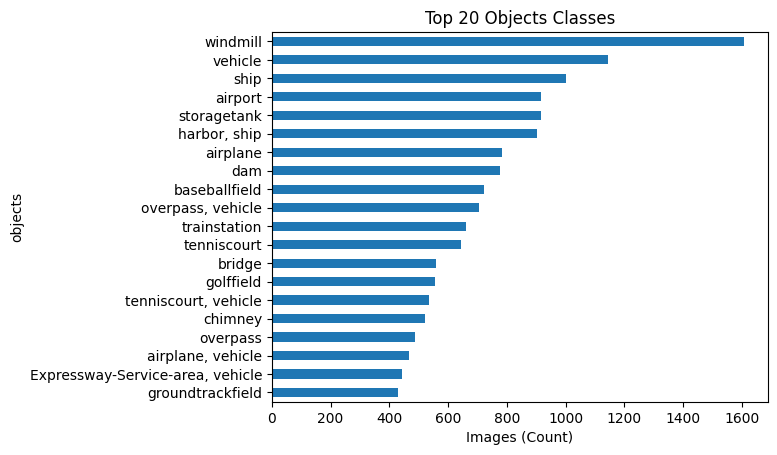

In [ ]:
# Top 20 classes in the dataset
meta_df.objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Top 20 Objects Classes');

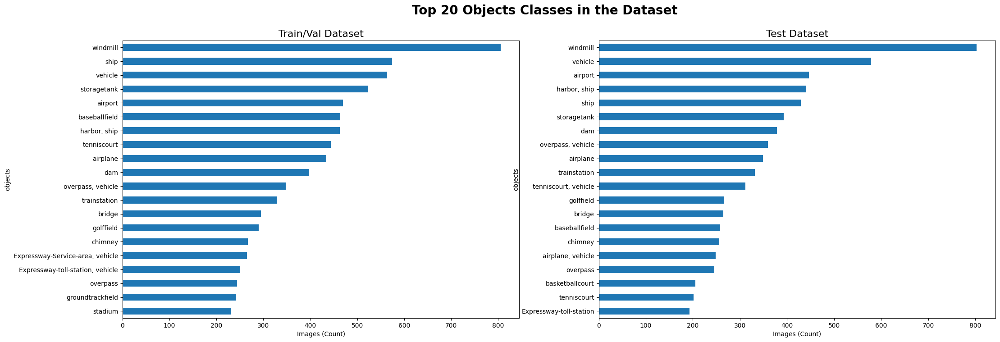

In [ ]:
plt.figure(figsize=(25, 8))
plt.subplot(1, 2, 1)
meta_df[meta_df["split_type"] == "JPEGImages-trainval"].objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Train/Val Dataset', fontsize=16)
plt.subplot(1, 2, 2)
meta_df[meta_df["split_type"] == "JPEGImages-test"].objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Test Dataset', fontsize=16)
plt.suptitle('Top 20 Objects Classes in the Dataset', fontsize=20, fontweight='bold');

### Converting Annotation to YOLO Format

In [ ]:
# Creating a function for extracting data
def extract_data_from_xml(xml_file: str):
    """
    A function to extract data like filename, size, classes and bboxes from xml file.

    Parameters: xml_file: str, A string containing the path to the file.

    Returns: data_dict: dict, A dict containing all the extracted data.
    """
    root = ElementTree.parse(xml_file).getroot()

    # Creating dict and list to store data
    data_dict = {}
    data_dict['bboxes'] = []

    # Reading the xml file
    for element in root:
        # Getting the filename
        if element.tag == 'filename':
            data_dict['filename'] = element.text

        # Getting the image size
        elif element.tag == 'size':
            image_size = []
            for size_element in element:
                image_size.append(int(size_element.text))
            data_dict['image_size'] = image_size

        # Getting the bounding box
        elif element.tag == 'object':
            bbox = {}
            for obj_element in element:
                # Object or Class name
                if obj_element.tag == 'name':
                    bbox['class'] = obj_element.text
                # Object bounding box
                elif obj_element.tag == 'bndbox':
                    for bbox_element in obj_element:
                        bbox[bbox_element.tag] = int(bbox_element.text)
            data_dict['bboxes'].append(bbox)
    return data_dict

In [ ]:
example = extract_data_from_xml(annot_file_list[1])
example

{'bboxes': [{'class': 'Expressway-toll-station',
   'xmin': 231,
   'ymin': 221,
   'xmax': 303,
   'ymax': 304},
  {'class': 'vehicle', 'xmin': 49, 'ymin': 231, 'xmax': 67, 'ymax': 242},
  {'class': 'vehicle', 'xmin': 54, 'ymin': 252, 'xmax': 72, 'ymax': 262},
  {'class': 'vehicle', 'xmin': 297, 'ymin': 227, 'xmax': 316, 'ymax': 239}],
 'filename': '00002.jpg',
 'image_size': [800, 800, 3]}

In [ ]:
# Creating a function to create a YOLO format annotation
def convert_dict_to_yolo(data_dict: dict):
    """
    A function to convert the extracted data dict into a text file as per the YOLO format.
    The final text file is saved in the directory "dior_data/yolo_annotations/data_dict['filename'].txt".

    Parameters: data_dict: dict, A dict containing the data.
    """
    data = []

    # Reading the bounding box data
    for bbox in data_dict['bboxes']:
        try:
            class_id = class_dict[bbox['class']]
        except KeyError:
            print(f'Invalid Class. Object class: "{bbox["class"]}" not present in the class list.')

        # Transforming the bbox in Yolo format [X, Y, W, H]
        img_w, img_h, _ = data_dict['image_size'] # Normalizing the bbox using image size

        x_center = ((bbox['xmin'] + bbox['xmax']) / 2) / img_w
        y_center = ((bbox['ymin'] + bbox['ymax']) / 2) / img_h
        width = (bbox['xmax'] - bbox['xmin']) / img_w
        height = (bbox['ymax'] - bbox['ymin']) / img_h

        # Writing the new data to the data list in Yolo format
        data.append(f'{class_id} {x_center:.3f} {y_center:.3f} {width:.3f} {height:.3f}')

    # File name for saving the text file(same as xml and jpg file name)
    yolo_annot_dir = os.path.join('dior_data', 'yolo_annotations')
    if not os.path.exists(yolo_annot_dir):
        os.makedirs(yolo_annot_dir)
    save_file_name = os.path.join(yolo_annot_dir, data_dict['filename'].replace('jpg', 'txt'))

    # Saving the yolo annotation in a text file
    f = open(save_file_name, 'w+')
    f.write('\n'.join(data))
    f.close()

In [ ]:
# Converting all the xml files into Yolo format text files
print('[INFO] Annotation extraction and creation into Yolo has started.')
for annot_file in tqdm(annot_file_list):
    data_dict = extract_data_from_xml(annot_file)
    convert_dict_to_yolo(data_dict)
print('[INFO] All the annotation are converted into Yolo format.')

[INFO] Annotation extraction and creation into Yolo has started.


100%|██████████| 23463/23463 [00:06<00:00, 3356.89it/s]

[INFO] All the annotation are converted into Yolo format.


In [ ]:
yolo_annot_path = 'dior_data/yolo_annotations'
yolo_annot_file_list = sorted([os.path.join(yolo_annot_path, i) for i in os.listdir(yolo_annot_path) if '.txt' in i])
yolo_annot_file_list[:5], yolo_annot_file_list[-5:], len(yolo_annot_file_list)

(['dior_data/yolo_annotations/00001.txt',
  'dior_data/yolo_annotations/00002.txt',
  'dior_data/yolo_annotations/00003.txt',
  'dior_data/yolo_annotations/00004.txt',
  'dior_data/yolo_annotations/00005.txt'],
 ['dior_data/yolo_annotations/23459.txt',
  'dior_data/yolo_annotations/23460.txt',
  'dior_data/yolo_annotations/23461.txt',
  'dior_data/yolo_annotations/23462.txt',
  'dior_data/yolo_annotations/23463.txt'],
 23463)

In [ ]:
class_dict_idx = dict(zip(class_dict.values(), class_dict.keys()))
class_dict_idx

{0: 'Expressway-Service-area',
 1: 'Expressway-toll-station',
 2: 'airplane',
 3: 'airport',
 4: 'baseballfield',
 5: 'basketballcourt',
 6: 'bridge',
 7: 'chimney',
 8: 'dam',
 9: 'golffield',
 10: 'groundtrackfield',
 11: 'harbor',
 12: 'overpass',
 13: 'ship',
 14: 'stadium',
 15: 'storagetank',
 16: 'tenniscourt',
 17: 'trainstation',
 18: 'vehicle',
 19: 'windmill'}

### Stratified split

In [ ]:
import os
import shutil
import numpy as np
import gdown
from tqdm import tqdm
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
import xml.etree.ElementTree as ET

In [ ]:
# Function to parse XML and get class labels
def get_class_from_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    return [obj.find('name').text for obj in root.findall('object')]

In [ ]:
trainval_labels = []
for annot_file in trainval_file_list:
    annot_path = os.path.join(annot_data_path, os.path.basename(annot_file).replace('.jpg', '.xml'))
    if os.path.exists(annot_path):
        trainval_labels.append(get_class_from_annotation(annot_path)[0])
    else:
        trainval_labels.append('unknown')

In [ ]:
test_labels = []
for annot_file in test_file_list:
    annot_path = os.path.join(annot_data_path, os.path.basename(annot_file).replace('.jpg', '.xml'))
    if os.path.exists(annot_path):
        test_labels.append(get_class_from_annotation(annot_path)[0])
    else:
        test_labels.append('unknown')

In [ ]:
# Stratified splitting of the dataset
sss_test = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
trainval_indices, test_indices = next(sss_test.split(trainval_file_list, trainval_labels))

trainval_file_list = np.array(trainval_file_list)
test_file_list = np.array(test_file_list)
train_files, test_files = trainval_file_list[trainval_indices], test_file_list[test_indices]
train_labels, test_labels = np.array(trainval_labels)[trainval_indices], np.array(test_labels)[test_indices]

sss_val = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)  # 0.25 * 0.8 = 0.2 of total dataset
train_indices, val_indices = next(sss_val.split(train_files, train_labels))

train_files, val_files = train_files[train_indices], train_files[val_indices]
train_labels, val_labels = train_labels[train_indices], train_labels[val_indices]

In [ ]:
trainval_file_list[:5], trainval_file_list[-5:], len(trainval_file_list)

(array(['dior_data/JPEGImages-trainval/00001.jpg', 'dior_data/JPEGImages-trainval/00002.jpg', 'dior_data/JPEGImages-trainval/00003.jpg', 'dior_data/JPEGImages-trainval/00004.jpg', 'dior_data/JPEGImages-trainval/00005.jpg'], dtype='<U39'),
 array(['dior_data/JPEGImages-trainval/11721.jpg', 'dior_data/JPEGImages-trainval/11722.jpg', 'dior_data/JPEGImages-trainval/11723.jpg', 'dior_data/JPEGImages-trainval/11724.jpg', 'dior_data/JPEGImages-trainval/11725.jpg'], dtype='<U39'),
 11725)

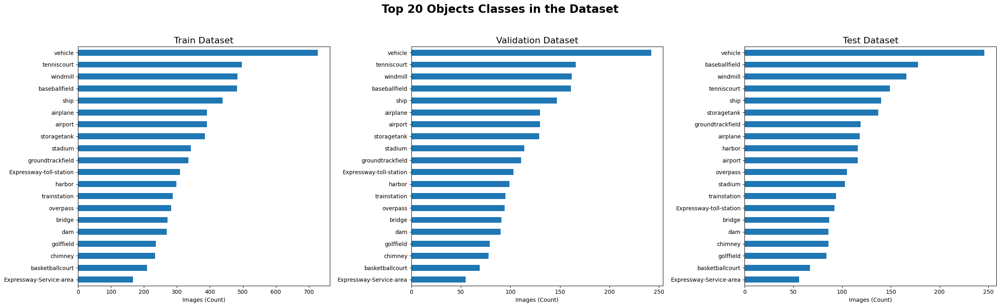

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter

# Assuming train_labels, val_labels, and test_labels contain the class labels for each set

# Count the occurrences of each class in train, validation, and test sets
train_counts = Counter(train_labels)
val_counts = Counter(val_labels)
test_counts = Counter(test_labels)

trainval_counts = train_counts + val_counts

# Convert the counts to DataFrames for easier plotting
train_df = pd.DataFrame.from_dict(train_counts, orient='index', columns=['count'])
val_df = pd.DataFrame.from_dict(val_counts, orient='index', columns=['count'])
test_df = pd.DataFrame.from_dict(test_counts, orient='index', columns=['count'])
trainval_df = pd.DataFrame.from_dict(trainval_counts, orient='index', columns=['count'])

# Sort the DataFrames by count for better visualization
train_df = train_df.sort_values(by='count', ascending=False)
val_df = val_df.sort_values(by='count', ascending=False)
test_df = test_df.sort_values(by='count', ascending=False)
trainval_df = trainval_df.sort_values(by='count', ascending=False)

# Plot the top 20 classes in each dataset
plt.figure(figsize=(25, 8))

plt.subplot(1, 3, 1)
train_df[:20].plot(kind='barh', legend=False, ax=plt.gca()).invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Train Dataset', fontsize=16)

plt.subplot(1, 3, 2)
val_df[:20].plot(kind='barh', legend=False, ax=plt.gca()).invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Validation Dataset', fontsize=16)

plt.subplot(1, 3, 3)
test_df[:20].plot(kind='barh', legend=False, ax=plt.gca()).invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Test Dataset', fontsize=16)

plt.suptitle('Top 20 Objects Classes in the Dataset', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


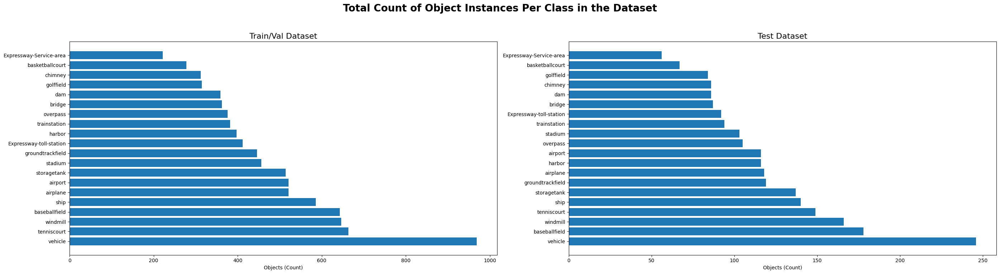

In [ ]:
plt.figure(figsize=(28, 8))

plt.subplot(1, 2, 1)
plt.barh(list(trainval_df.index), list(trainval_df['count']))
plt.xlabel('Objects (Count)')
plt.title('Train/Val Dataset', fontsize=16)

plt.subplot(1, 2, 2)
plt.barh(list(test_df.index), list(test_df['count']))
plt.xlabel('Objects (Count)')
plt.title('Test Dataset', fontsize=16)

plt.suptitle('Total Count of Object Instances Per Class in the Dataset', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Training the Yolo Model

In [ ]:
# Creating images and labels directory into the data directory
root_dir = 'datasets'
image_dir = 'datasets/images'
label_dir = 'datasets/labels'
img_train_dir = 'datasets/images/train'
img_val_dir = 'datasets/images/val'
label_train_dir = 'datasets/labels/train'
label_val_dir = 'datasets/labels/val'

# Function to move files
def move_files(file_list, target_dir):
    if not os.path.exists(target_dir):
        os.makedirs(target_dir)
    for filepath in tqdm(file_list):
        if os.path.isfile(filepath):
            shutil.move(filepath, target_dir)

# Moving the training images
move_files(train_files, img_train_dir)

# Moving the validation images
move_files(val_files, img_val_dir)


# Function to move corresponding labels
def move_labels(file_list, target_dir):
    if not os.path.exists(target_dir):
        os.makedirs(target_dir)
    for filepath in tqdm(file_list):
        file_path = os.path.join('dior_data/yolo_annotations', filepath.replace('jpg', 'txt').split('/')[-1])
        if os.path.isfile(file_path):
            shutil.move(file_path, target_dir)

# Moving the training labels
move_labels(train_files, label_train_dir)

# Moving the validation labels
move_labels(val_files, label_val_dir)


100%|██████████| 2345/2345 [00:00<00:00, 18683.92it/s]


In [ ]:
# Loading the model
# model = YOLO('yolov8n.yaml') # Builds the model from scratch

# Loading a pretrained model (Not using this for my dataset)
# model = YOLO('yolov8n.pt')

In [ ]:
%%writefile config.yaml
# Path to my dataset
path:
train: 'images/train'
val: 'images/val'

# Classes as per mentioned in the annotation
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill

Writing config.yaml


In [ ]:
model = YOLO('/kaggle/input/best-pt/best (1).pt') # this is a pretrain yolo8 on coco, then fine-tuned on dior for 93 epochs

In [ ]:
results = model.train(data='config.yaml', imgsz=800, seed = 42, epochs=7, batch=16, name='yolov8n_epochs100_batch16')

Ultralytics YOLOv8.2.41 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/best-pt/best (1).pt, data=config.yaml, epochs=7, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_epochs100_batch16, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True,

100%|██████████| 755k/755k [00:00<00:00, 14.0MB/s]
2024-06-23 22:31:43,087	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-06-23 22:31:44,133	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 73.0MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/datasets/labels/train... 7035 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7035/7035 [00:07<00:00, 921.75it/s]

train: WARNING ⚠️ /kaggle/working/datasets/images/train/00594.jpg: 1 duplicate labels removed


train: New cache created: /kaggle/working/datasets/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/datasets/labels/val... 2345 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2345/2345 [00:02<00:00, 863.78it/s]

val: New cache created: /kaggle/working/datasets/labels/val.cache


Plotting labels to runs/detect/yolov8n_epochs100_batch16/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_epochs100_batch16
Starting training for 7 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/7      7.77G      0.845     0.5351     0.9874        107        800: 100%|██████████| 440/440 [02:12<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.13it/s]

                   all       2345      12908      0.899      0.814      0.865      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/7      8.85G     0.8532     0.5488     0.9925        152        800: 100%|██████████| 440/440 [02:05<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.29it/s]


                   all       2345      12908      0.892      0.806      0.856      0.637

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/7      8.57G     0.8566     0.5583     0.9969         80        800: 100%|██████████| 440/440 [02:05<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.26it/s]


                   all       2345      12908      0.877      0.804      0.852      0.634

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/7        11G     0.8656     0.5551     0.9942         65        800: 100%|██████████| 440/440 [02:05<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.27it/s]


                   all       2345      12908      0.889      0.805      0.854      0.637

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/7      13.1G     0.8487      0.546     0.9922         47        800: 100%|██████████| 440/440 [02:05<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.28it/s]


                   all       2345      12908      0.891      0.809      0.861      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        6/7      7.08G     0.8351     0.5265     0.9865        110        800: 100%|██████████| 440/440 [02:04<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.25it/s]


                   all       2345      12908      0.883      0.819      0.859      0.648

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        7/7      9.77G     0.8353     0.5257     0.9808        191        800: 100%|██████████| 440/440 [02:03<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.28it/s]


                   all       2345      12908      0.883       0.82      0.864      0.649

7 epochs completed in 0.293 hours.
Optimizer stripped from runs/detect/yolov8n_epochs100_batch16/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8n_epochs100_batch16/weights/best.pt, 6.3MB

Validating runs/detect/yolov8n_epochs100_batch16/weights/best.pt...
Ultralytics YOLOv8.2.41 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3009548 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:25<00:00,  2.88it/s]


                   all       2345      12908      0.883       0.82      0.864      0.649
Expressway-Service-area        105        202      0.933      0.896      0.933      0.644
Expressway-toll-station        110        117      0.943      0.786      0.865       0.68
              airplane        134        411      0.992      0.908      0.943       0.83
               airport        130        132      0.788      0.871      0.897      0.581
         baseballfield        212        441      0.965      0.993       0.99      0.918
       basketballcourt        134        229       0.93      0.812      0.852      0.786
                bridge        191        281      0.833       0.53      0.657      0.409
               chimney         83        129       0.97      0.922      0.949      0.858
                   dam         94        104      0.835      0.679       0.75      0.441
             golffield         86         94      0.793       0.83      0.851      0.591
      groundtrackfi

lr/pg0,▃▆█▆▅▃▁
lr/pg1,▃▆█▆▅▃▁
lr/pg2,▃▆█▆▅▃▁
metrics/mAP50(B),█▃▁▂▆▅█
metrics/mAP50-95(B),▇▃▁▃▅██
metrics/precision(B),█▆▁▅▆▃▃
metrics/recall(B),▅▂▁▂▃██
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▃▅▆█▄▁▁


## Testing the YOLO model

In [ ]:
# Creating a test directory
img_test_dir = 'datasets/images/test'

# Moving the Testing images[80% of test dataset]
if not os.path.exists(img_test_dir):
    os.makedirs(img_test_dir)

test_list = os.listdir('dior_data/JPEGImages-test')
for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/JPEGImages-test', filename)
    if os.path.isfile(filepath):
        shutil.move(filepath, img_test_dir)

100%|██████████| 11738/11738 [00:00<00:00, 18605.46it/s]


In [ ]:
label_test_dir = 'datasets/labels/test'

# Moving the testing annotation [80% of testing dataset]
if not os.path.exists(label_test_dir):
    os.makedirs(label_test_dir)

for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/yolo_annotations', filename).replace('jpg', 'txt')
    if os.path.isfile(filepath):
        shutil.move(filepath, label_test_dir)

100%|██████████| 11738/11738 [00:00<00:00, 18401.16it/s]


In [ ]:
%%writefile test_config.yaml
# Path to my dataset
path:
train:
val: 'images/test'

# Classes as per mentioned in the annotation
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill

Writing test_config.yaml


In [ ]:
# Loading the best weights
model = YOLO('runs/detect/yolov8n_epochs100_batch16/weights/best.pt')

In [ ]:
# Validating the
test_results = model.val(data='test_config.yaml', imgsz=800, name='yolov8n_val_on_test')

Ultralytics YOLOv8.2.41 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3009548 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/datasets/labels/test... 11738 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11738/11738 [00:12<00:00, 973.37it/s] 


val: New cache created: /kaggle/working/datasets/labels/test.cache


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 734/734 [02:22<00:00,  5.16it/s]


                   all      11738     124445      0.848      0.685       0.76      0.532
Expressway-Service-area        565       1085      0.899      0.786      0.847      0.589
Expressway-toll-station        634        688      0.935      0.626      0.748      0.554
              airplane        705       8212      0.956      0.703      0.833       0.58
               airport        657        666      0.757      0.796       0.83      0.535
         baseballfield       1311       3434      0.955      0.704      0.842      0.696
       basketballcourt        705       2146      0.921       0.85      0.892      0.778
                bridge       1299       2589      0.727      0.421      0.497      0.269
               chimney        447       1031      0.952      0.731      0.783      0.667
                   dam        503        538      0.678      0.647      0.653      0.366
             golffield        491        575      0.807      0.776      0.802      0.549
      groundtrackfi

## Best YoloV8n Model Testing Results

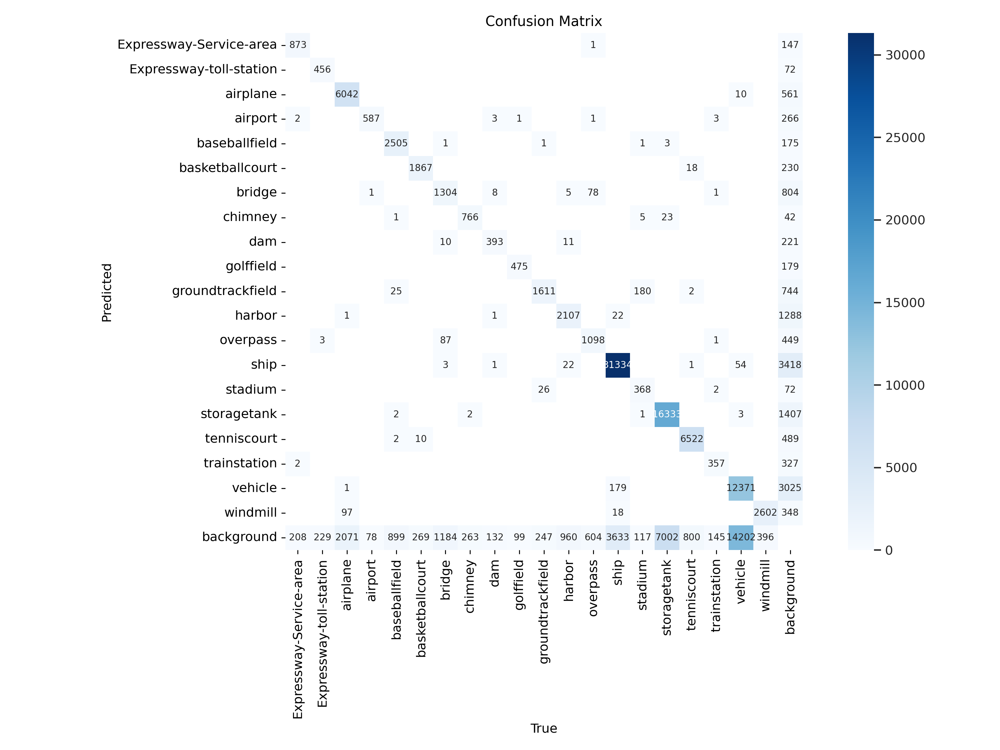

In [ ]:
# Confusion Matrix
Image('runs/detect/yolov8n_val_on_test/confusion_matrix.png')

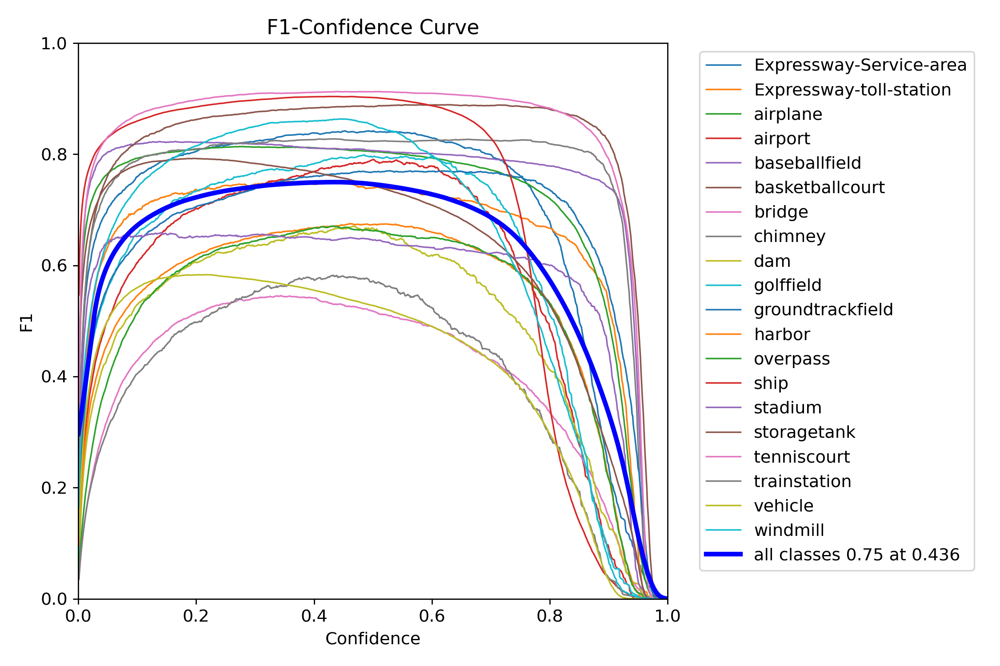

In [ ]:
# F1 Curve
Image('runs/detect/yolov8n_val_on_test/F1_curve.png')

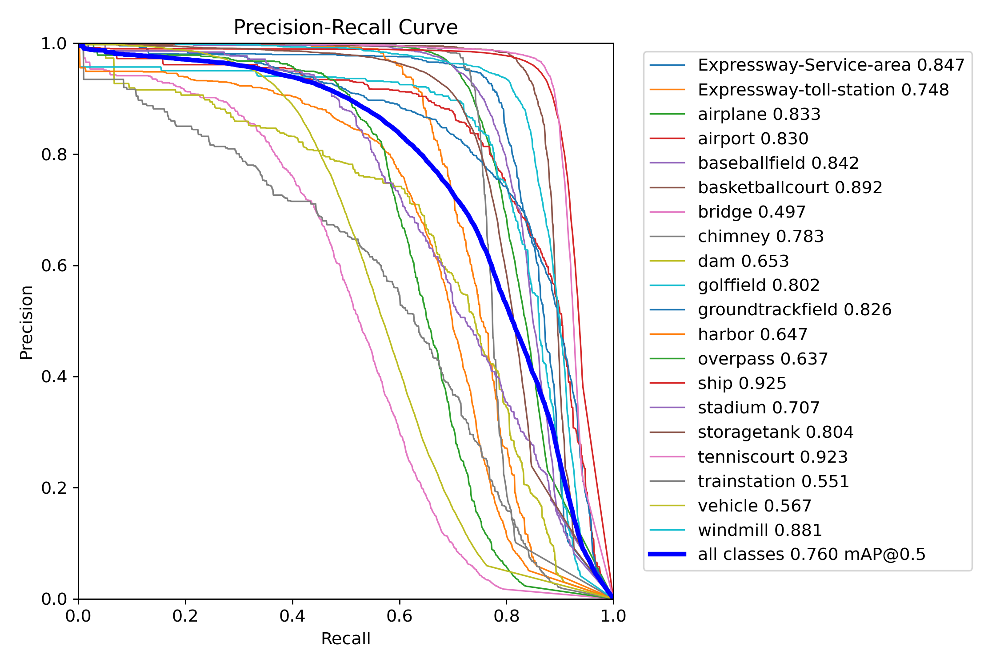

In [ ]:
# PR Curve
Image('runs/detect/yolov8n_val_on_test/PR_curve.png')

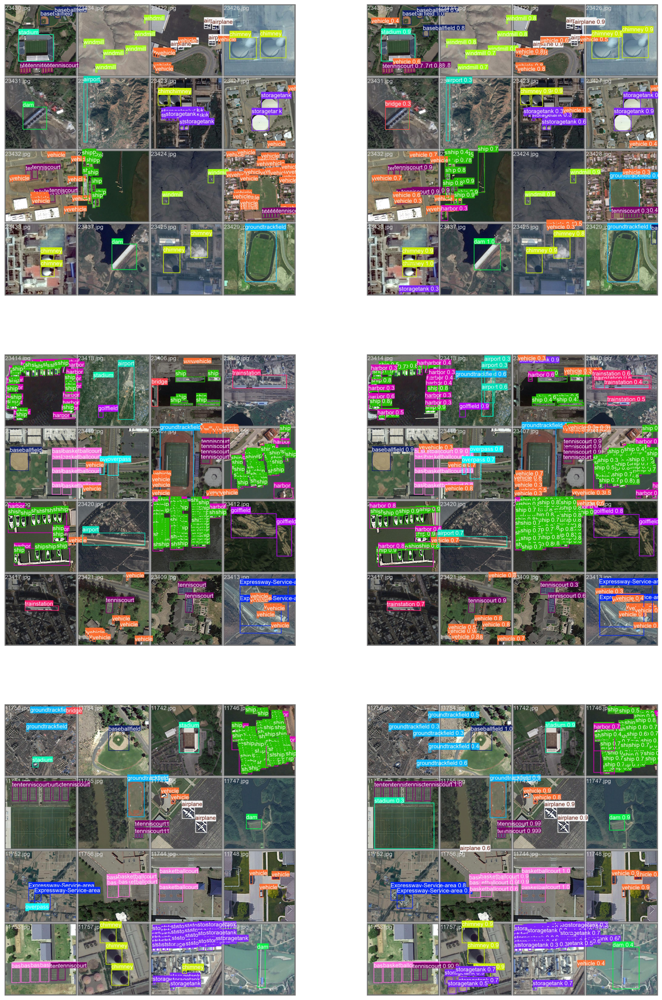

In [ ]:
# Testing result[left images are True and Right images are predicted]
val_result_image = ['runs/detect/yolov8n_val_on_test/val_batch0_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch0_pred.jpg', 'runs/detect/yolov8n_val_on_test/val_batch1_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch1_pred.jpg', 'runs/detect/yolov8n_val_on_test/val_batch2_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch2_pred.jpg']
plt.figure(figsize=(20, 30))
for i in range(len(val_result_image)):
    plt.subplot(3, 2, i+1)
    plt.imshow(plt.imread(val_result_image[i]))
    plt.axis(False)

## Predicting using the Yolo Model

In [ ]:
# Loading the best weights
model = YOLO('runs/detect/yolov8n_epochs100_batch16/weights/best.pt')

In [ ]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

sns.set_style('darkgrid')

%matplotlib inline

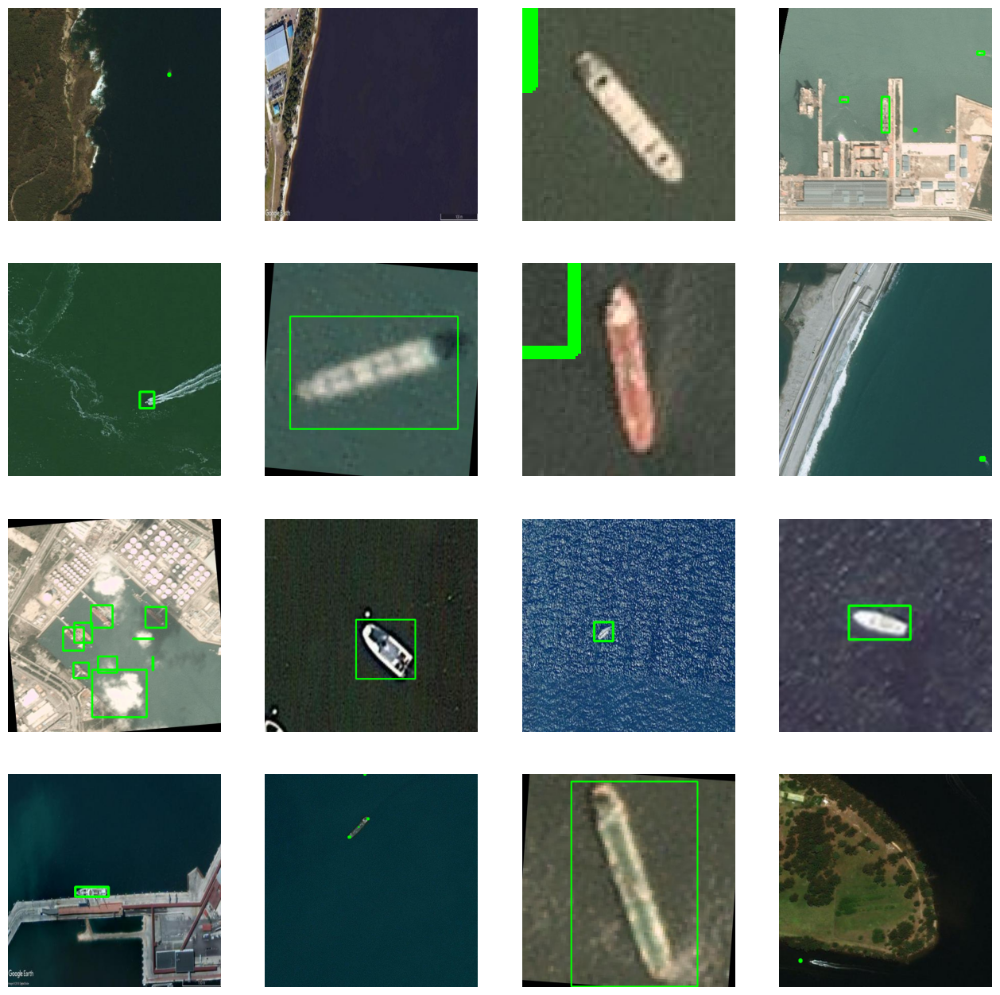

In [ ]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/train/images"
train_labels = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/train/labels"

test_images = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/test/images"
test_labels = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/test/labels"

val_images = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/valid/images"
val_labels = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/valid/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4

    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [ ]:
# results = model.predict(test_images, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1573 /kaggle/input/ships-in-aerial-images/ships-aerial-images/test/images/02e39612d_jpg.rf.cc5483bb711f080d12b644ff62cf977a.jpg: 800x800 2 ships, 10.1ms
image 2/1573 /kaggle/input/ships-in-aerial-images/ships-aerial-images/test/images/04-33800_jpg.rf.c45762dfac8f4c20534434159df41ad2.jpg: 800x800 (no detections), 10.0ms
image 3/1573 /kaggle/input/ships-in-aerial-images/ships-aerial-images/test/images/043d8815e_jpg.rf.702fa31e03a8a1c28e5fb63c561a

In [ ]:
def ship_detect(img_path):

    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()

    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    return detect_img


0: 800x800 1 ship, 8.3ms
Speed: 4.0ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 (no detections), 8.2ms
Speed: 4.1ms preprocess, 8.2ms inference, 0.5ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 ship, 8.2ms
Speed: 5.0ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 2 ships, 8.2ms
Speed: 4.8ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 (no detections), 8.2ms
Speed: 4.1ms preprocess, 8.2ms inference, 0.5ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 (no detections), 8.3ms
Speed: 3.8ms preprocess, 8.3ms inference, 0.5ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 (no detections), 8.3ms
Speed: 3.0ms preprocess, 8.3ms inference, 0.5ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 ship, 8.3ms
Speed: 2.9ms preprocess, 8.3ms inference, 1.2ms postprocess per image at shape (1, 

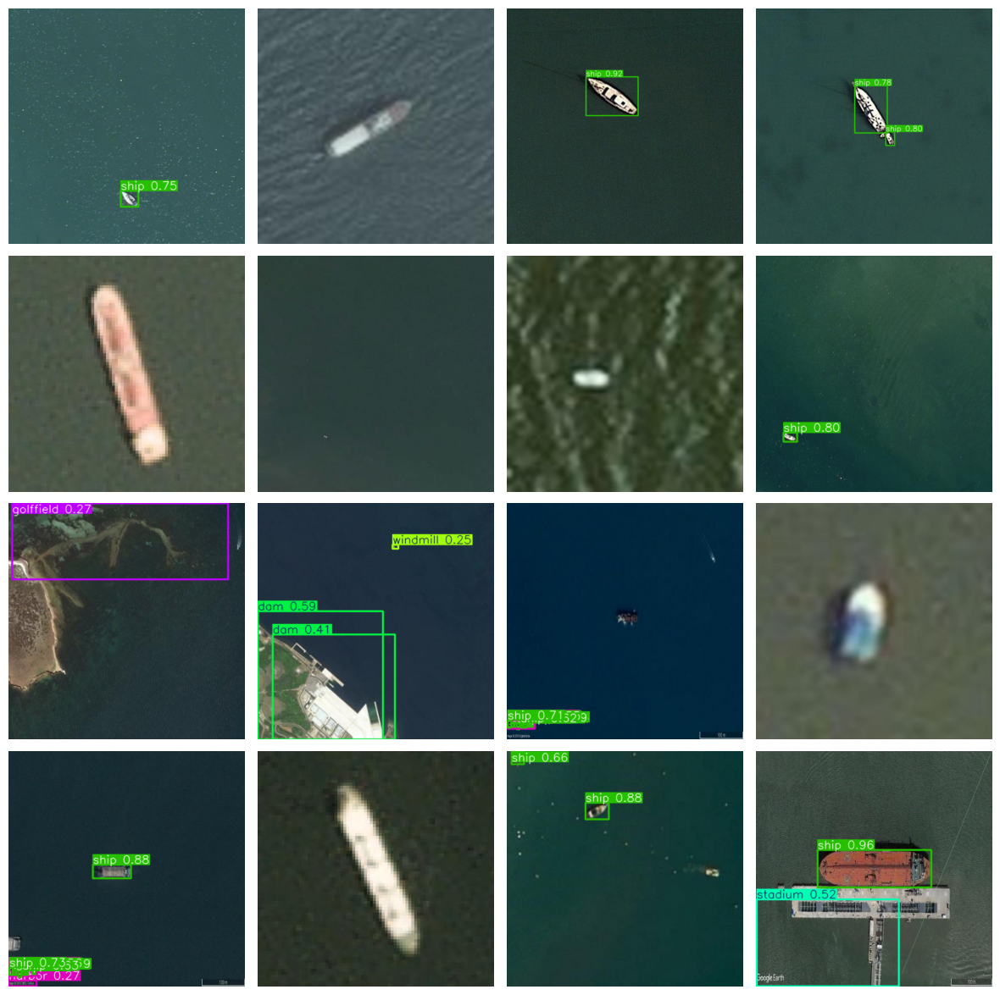

In [ ]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/ships-in-aerial-images/ships-aerial-images/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):

    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4

    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)

    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)


In [ ]:
!yolo task=detect mode=val model=runs/detect/yolov8n_epochs100_batch16/weights/best.pt data=/kaggle/input/ships-in-aerial-images/ships-aerial-images/data.yaml imgsz=768


Ultralytics YOLOv8.2.41 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3009548 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /kaggle/input/ships-in-aerial-images/ships-aerial-images/valid/lab
val: WARNING ⚠️ Cache directory /kaggle/input/ships-in-aerial-images/ships-aerial-images/valid is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 172, len(boxes) = 3720. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       2165       3720      0.176     0.0234       0.09      0.044
Expressway-Service-area       2097       3720      0.176     0.0234       0.09      0.044
Speed: 0.5ms preprocess, 5.5ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved 